# **FACE DETECTION**

### **RetinaFace**

In [ ]:
import torch
import torch.nn as nn
import pandas as pd


df = pd.DataFrame({'category': [0, 1, 2, 2, 1, 0, 3]})
device = 'cpu'
in_feats = 5

embedding_layer = nn.Embedding(max(df['category'].unique()) + 1, in_feats).to(device)

# Example input (batch of categories)
category_input = torch.tensor([0, 1, 2, 3])  # Shape (4,)

# Get embeddings
output = embedding_layer(category_input)
print(output)
print(output.shape)  # Output shape: (4, 5)


tensor([[-0.7068, -0.0669,  0.1919, -0.1724, -0.4377],
        [-1.0042,  0.7323,  1.0759, -0.3820, -1.9542],
        [-0.9590,  0.9186,  0.5479, -1.2708, -0.6856],
        [-0.2271,  1.4554,  1.5992,  0.3312, -1.5253]],
       grad_fn=<EmbeddingBackward0>)
torch.Size([4, 5])


In [ ]:
# import kagglehub
# import shutil

# # Download the dataset
# dataset_path = kagglehub.dataset_download("hojjatk/mnist-dataset")

# # Define the target directory
# target_directory = "/content/"

# # Move dataset to sample_data
# shutil.move(dataset_path, target_directory)

# print("Dataset moved to:", target_directory)


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
!pip install retina-face

In [ ]:
from retinaface import RetinaFace
import cv2
import matplotlib.pyplot as plt

In [ ]:
img_path = "/content/DSCF3076.JPG"

img=cv2.imread(img_path)
obj = RetinaFace.detect_faces(img_path)

Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/retinaface.h5
To: /root/.deepface/weights/retinaface.h5


25-10-08 18:24:03 - Directory /root/.deepface created
25-10-08 18:24:03 - Directory /root/.deepface/weights created
25-10-08 18:24:03 - retinaface.h5 will be downloaded from the url https://github.com/serengil/deepface_models/releases/download/v1.0/retinaface.h5


100%|██████████| 119M/119M [00:00<00:00, 280MB/s]


In [ ]:
len(obj.keys())

50

In [ ]:
for key in obj.keys():
  identity=obj[key]
  facial_area= identity["facial_area"]

  cv2.rectangle(img, (facial_area[2],facial_area[3]),(facial_area[0],facial_area[1]), (0,255,0), 10)

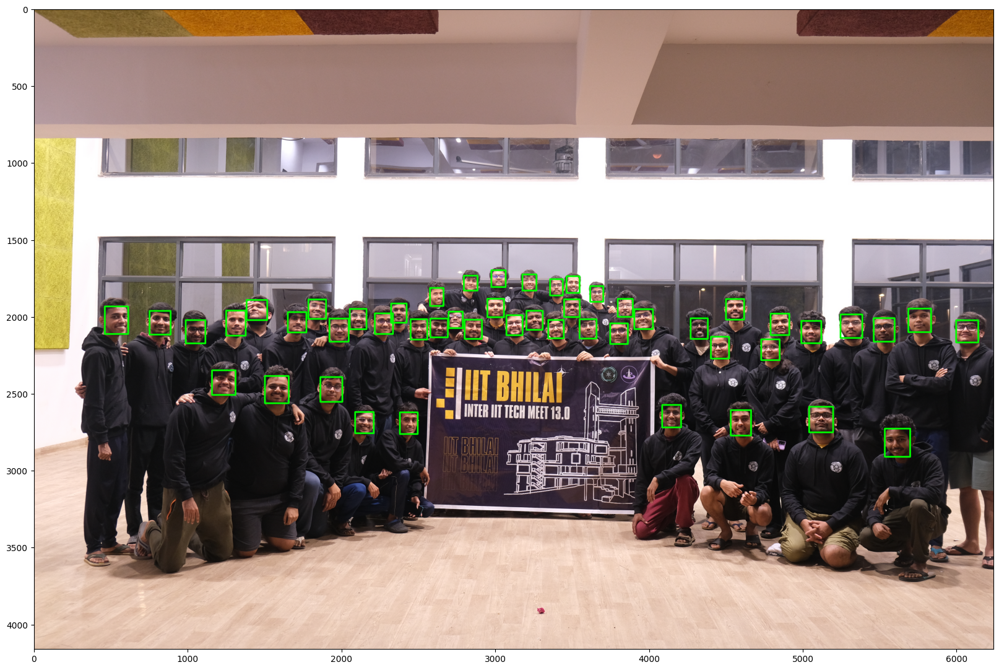

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(img[:,: , ::-1])
plt.show()

### **DeepFace**

In [ ]:
!pip install DeepFace

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.3/128.3 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.9/115.9 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.0/85.0 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 85.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 60.7 MB/s eta 0:00:00


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/facenet512_weights.h5
To: /root/.deepface/weights/facenet512_weights.h5


25-10-08 18:24:39 - 🔗 facenet512_weights.h5 will be downloaded from https://github.com/serengil/deepface_models/releases/download/v1.0/facenet512_weights.h5 to /root/.deepface/weights/facenet512_weights.h5...


100%|██████████| 95.0M/95.0M [00:00<00:00, 249MB/s]


Face face_8 matches with the source image.


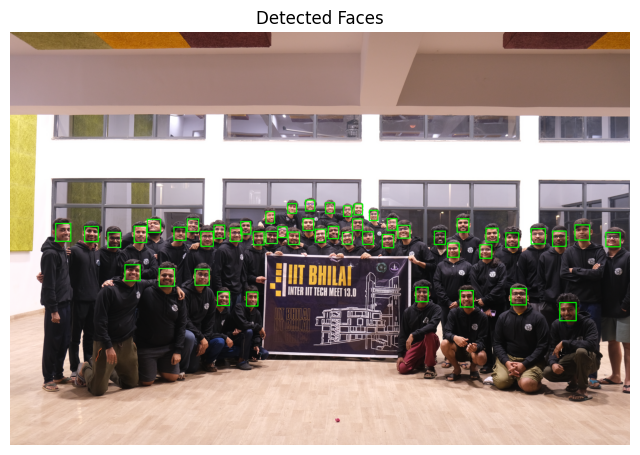

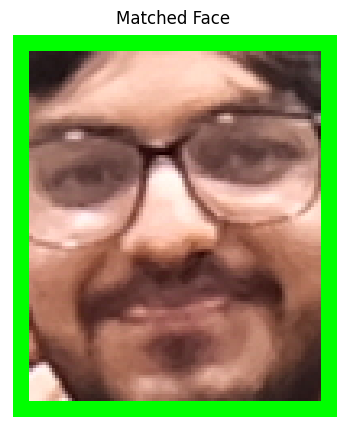

In [ ]:
import cv2
import matplotlib.pyplot as plt
from deepface import DeepFace

# Load the source image
source_img_path = "/content/DSCF3070.JPG"


# List to store matched face images
matched_faces = []

for key in obj.keys():
    identity = obj[key]
    facial_area = identity["facial_area"]

    # Draw rectangle around the detected face
    cv2.rectangle(img, (facial_area[2], facial_area[3]), (facial_area[0], facial_area[1]), (255, 255, 255), 1)

    # Crop the face region from the detected image
    detected_face = img[facial_area[1]:facial_area[3], facial_area[0]:facial_area[2]]

    # Match the detected face with the source image
    try:
        result = DeepFace.verify(detected_face, source_img_path, model_name="Facenet512", enforce_detection=False)

        if result["verified"]:
            print(f"Face {key} matches with the source image.")
            matched_faces.append(detected_face)  # Store matched faces
            break

    except Exception as e:
        print(f"Error processing face {key}: {e}")

# Plot the original image
plt.figure(figsize=(8, 8))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title("Detected Faces")
plt.axis("off")
plt.show()

# Plot all matched faces
if matched_faces:
    fig, axes = plt.subplots(1, len(matched_faces), figsize=(5 * len(matched_faces), 5))

    if len(matched_faces) == 1:
        axes.imshow(cv2.cvtColor(matched_faces[0], cv2.COLOR_BGR2RGB))
        axes.set_title("Matched Face")
        axes.axis("off")
    else:
        for i, face in enumerate(matched_faces):
            axes[i].imshow(cv2.cvtColor(face, cv2.COLOR_BGR2RGB))
            axes[i].set_title(f"Matched Face {i+1}")
            axes[i].axis("off")

    plt.show()
else:
    print("No matched faces found.")


# **FACE EMBEDDINGS AND MATCHING WITH COSINE SIMILARITY**

In [ ]:
!pip install tensorflow opencv-python mtcnn scikit-learn scipy

In [ ]:
import os
import cv2
from retinaface import RetinaFace

# Input image path
img_path = "/content/DSCF3076.JPG"

# Output directory to save detected faces
output_folder = "/content/input_faces"
os.makedirs(output_folder, exist_ok=True)

# Load image
img = cv2.imread(img_path)

# Detect faces
faces = RetinaFace.detect_faces(img_path)

# Process each detected face
for i, key in enumerate(faces.keys()):
    identity = faces[key]
    facial_area = identity["facial_area"]

    # Crop the face
    x1, y1, x2, y2 = facial_area
    face_crop = img[y1:y2, x1:x2]

    # Save the cropped face
    face_filename = os.path.join(output_folder, f"face_{i+1}.jpg")
    cv2.imwrite(face_filename, face_crop)
    print(f"✅ Saved: {face_filename}")

print(f"✅ All detected faces are saved in {output_folder}")


✅ Saved: /content/input_faces/face_1.jpg
✅ Saved: /content/input_faces/face_2.jpg
✅ Saved: /content/input_faces/face_3.jpg
✅ Saved: /content/input_faces/face_4.jpg
✅ Saved: /content/input_faces/face_5.jpg
✅ Saved: /content/input_faces/face_6.jpg
✅ Saved: /content/input_faces/face_7.jpg
✅ Saved: /content/input_faces/face_8.jpg
✅ Saved: /content/input_faces/face_9.jpg
✅ Saved: /content/input_faces/face_10.jpg
✅ Saved: /content/input_faces/face_11.jpg
✅ Saved: /content/input_faces/face_12.jpg
✅ Saved: /content/input_faces/face_13.jpg
✅ Saved: /content/input_faces/face_14.jpg
✅ Saved: /content/input_faces/face_15.jpg
✅ Saved: /content/input_faces/face_16.jpg
✅ Saved: /content/input_faces/face_17.jpg
✅ Saved: /content/input_faces/face_18.jpg
✅ Saved: /content/input_faces/face_19.jpg
✅ Saved: /content/input_faces/face_20.jpg
✅ Saved: /content/input_faces/face_21.jpg
✅ Saved: /content/input_faces/face_22.jpg
✅ Saved: /content/input_faces/face_23.jpg
✅ Saved: /content/input_faces/face_24.jpg
✅

In [ ]:
import os
import numpy as np
from deepface import DeepFace
import cv2

# Define folder paths
IMAGE_FOLDER = "/content/input_faces"  # Change to your folder path
EMBEDDINGS_PATH = "/content/embeddings/face_embeddings.npz"

# Ensure output directory exists
os.makedirs(os.path.dirname(EMBEDDINGS_PATH), exist_ok=True)

def process_images(image_folder):
    embeddings = {}

    for filename in os.listdir(image_folder):
        if not filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            continue

        person_name = os.path.splitext(filename)[0]
        image_path = os.path.join(image_folder, filename)

        try:
            # Extract embedding
            embedding = DeepFace.represent(img_path=image_path, model_name="Facenet", enforce_detection=False)[0]['embedding']
            embeddings[person_name] = embedding
            print(f"✅ Processed: {filename}")
        except Exception as e:
            print(f"⚠️ Error processing {filename}: {e}")

    # Save embeddings
    np.savez_compressed(EMBEDDINGS_PATH, **embeddings)
    print(f"✅ Embeddings saved at {EMBEDDINGS_PATH}")

    return embeddings

# Run processing
embeddings = process_images(IMAGE_FOLDER)

Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/facenet_weights.h5
To: /root/.deepface/weights/facenet_weights.h5


25-10-08 18:26:33 - 🔗 facenet_weights.h5 will be downloaded from https://github.com/serengil/deepface_models/releases/download/v1.0/facenet_weights.h5 to /root/.deepface/weights/facenet_weights.h5...


100%|██████████| 92.2M/92.2M [00:00<00:00, 162MB/s]


✅ Processed: face_3.jpg
✅ Processed: face_11.jpg
✅ Processed: face_44.jpg
✅ Processed: face_35.jpg
✅ Processed: face_16.jpg
✅ Processed: face_19.jpg
✅ Processed: face_32.jpg
✅ Processed: face_13.jpg
✅ Processed: face_27.jpg
✅ Processed: face_33.jpg
✅ Processed: face_30.jpg
✅ Processed: face_49.jpg
✅ Processed: face_24.jpg
✅ Processed: face_47.jpg
✅ Processed: face_42.jpg
✅ Processed: face_41.jpg
✅ Processed: face_39.jpg
✅ Processed: face_48.jpg
✅ Processed: face_22.jpg
✅ Processed: face_25.jpg
✅ Processed: face_38.jpg
✅ Processed: face_2.jpg
✅ Processed: face_34.jpg
✅ Processed: face_29.jpg
✅ Processed: face_9.jpg
✅ Processed: face_20.jpg
✅ Processed: face_28.jpg
✅ Processed: face_50.jpg
✅ Processed: face_5.jpg
✅ Processed: face_1.jpg
✅ Processed: face_18.jpg
✅ Processed: face_23.jpg
✅ Processed: face_4.jpg
✅ Processed: face_37.jpg
✅ Processed: face_21.jpg
✅ Processed: face_6.jpg
✅ Processed: face_12.jpg
✅ Processed: face_40.jpg
✅ Processed: face_10.jpg
✅ Processed: face_46.jpg
✅ Proce


🔍 *Similarity Scores:*
face_3: 0.3111
face_11: 0.5067
face_44: 0.3400
face_35: 0.2951
face_16: 0.2687
face_19: 0.3230
face_32: 0.0302
face_13: 0.2770
face_27: 0.4696
face_33: 0.1964
face_30: 0.1751
face_49: 0.1469
face_24: 0.4428
face_47: 0.1636
face_42: 0.3862
face_41: 0.5491
face_39: 0.3268
face_48: 0.3879
face_22: 0.5426
face_25: 0.3467
face_38: 0.4324
face_2: 0.4681
face_34: 0.1451
face_29: 0.5399
face_9: 0.1893
face_20: 0.4849
face_28: 0.2723
face_50: 0.4679
face_5: 0.1610
face_1: 0.2298
face_18: 0.4322
face_23: 0.5463
face_4: 0.3872
face_37: 0.2867
face_21: 0.5831
face_6: 0.3314
face_12: 0.4015
face_40: 0.8427
face_10: 0.6688
face_46: 0.2483
face_14: 0.1377
face_26: 0.3922
face_8: 0.4809
face_31: 0.4537
face_15: 0.1639
face_17: 0.4244
face_7: 0.3709
face_45: 0.2430
face_36: 0.3353
face_43: 0.2220

🎯 Best Match: face_40 with similarity score 0.8427


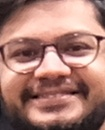

In [ ]:
import os
import numpy as np
from deepface import DeepFace
from scipy.spatial.distance import cosine
import cv2
from google.colab.patches import cv2_imshow  # Import cv2_imshow

# Define paths
EMBEDDINGS_PATH = "/content/embeddings/face_embeddings.npz"  # Path to stored embeddings
INPUT_IMAGE = "/content/faces/Screenshot from 2025-10-08 22-18-19.png"  # Change to the test image path
IMAGES_DIR = "/content/input_faces"  # Directory containing individual images

# ✅ Step 1: Load stored embeddings
if not os.path.exists(EMBEDDINGS_PATH):
    raise FileNotFoundError(f"❌ Embeddings file not found at {EMBEDDINGS_PATH}")

data = np.load(EMBEDDINGS_PATH)
embeddings_dict = {name: data[name] for name in data.files}

# ✅ Step 2: Extract embedding of input image
try:
    input_embedding = DeepFace.represent(img_path=INPUT_IMAGE, model_name="Facenet", enforce_detection=False)[0]['embedding']
except Exception as e:
    raise RuntimeError(f"❌ Failed to extract embedding from input image: {e}")

# ✅ Step 3: Compute similarity scores
scores = {}

for person, stored_embedding in embeddings_dict.items():
    similarity = 1 - cosine(input_embedding, stored_embedding)
    scores[person] = similarity

# ✅ Step 4: Find the best match
best_match = max(scores, key=scores.get)
best_score = scores[best_match]

# ✅ Step 5: Display results
print("\n🔍 *Similarity Scores:*")
for person, score in scores.items():
    print(f"{person}: {score:.4f}")

print(f"\n🎯 Best Match: {best_match} with similarity score {best_score:.4f}")

# ✅ Step 6: Display the image of the matched person
matched_image_path = os.path.join(IMAGES_DIR, f"{best_match}.jpg")  # Assuming images are named after the person
if os.path.exists(matched_image_path):
    matched_image = cv2.imread(matched_image_path)
    if matched_image is not None:
        cv2_imshow(matched_image)  # Use cv2_imshow instead of cv2.imshow
    else:
        print(f"❌ Failed to read the image for {best_match}.")
else:
    print(f"❌ Image for {best_match} not found at {matched_image_path}.")


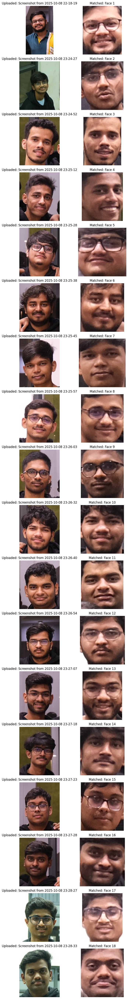

In [ ]:
import os
import numpy as np
from deepface import DeepFace
from scipy.spatial.distance import cosine
import cv2
import matplotlib.pyplot as plt

# Define paths
EMBEDDINGS_PATH = "/content/embeddings/face_embeddings.npz"  # Path to stored embeddings
IMAGES_DIR = "/content/input_faces"  # Directory containing individual images
FOLDER_INPUT_IMAGES = "/content/faces"  # Folder of images to match against the database

# ✅ Step 1: Load stored embeddings
if not os.path.exists(EMBEDDINGS_PATH):
    raise FileNotFoundError(f"❌ Embeddings file not found at {EMBEDDINGS_PATH}")

data = np.load(EMBEDDINGS_PATH)
embeddings_dict = {name: data[name] for name in data.files}

# ✅ Step 2: Function to process and extract embedding for an image
def extract_embedding(image_path):
    try:
        return DeepFace.represent(img_path=image_path, model_name="Facenet", enforce_detection=False)[0]['embedding']
    except Exception as e:
        print(f"❌ Failed to extract embedding from {image_path}: {e}")
        return None

# ✅ Step 3: Function to compute similarity score
def compute_similarity(input_embedding, embeddings_dict):
    scores = {}
    for person, stored_embedding in embeddings_dict.items():
        similarity = 1 - cosine(input_embedding, stored_embedding)
        scores[person] = similarity
    return scores

# ✅ Step 4: Process each image in the folder and find best match
def process_images(input_folder):
    results = []  # To store results for all images
    for image_name in sorted(os.listdir(input_folder)):
        image_path = os.path.join(input_folder, image_name)

        if os.path.isfile(image_path):
            # Extract the embedding for the input image
            input_embedding = extract_embedding(image_path)

            if input_embedding is not None:
                # Compute similarity with stored embeddings
                scores = compute_similarity(input_embedding, embeddings_dict)

                # Find the best match
                best_match = max(scores, key=scores.get)
                best_score = scores[best_match]

                # Get matched image path
                matched_image_path = os.path.join(IMAGES_DIR, f"{best_match}.jpg")  # Assuming images are named after the person

                # Check if the matched image exists
                if os.path.exists(matched_image_path):
                    matched_image = cv2.imread(matched_image_path)
                else:
                    matched_image = None

                # Append results
                results.append({
                    'uploaded': os.path.basename(image_path).split('.')[0],
                    'input_image': image_path,
                    'best_match': best_match,
                    'best_score': best_score,
                    'matched_image': matched_image
                })
    return results

# ✅ Step 5: Create custom output visualization
def display_results(results):
    # Calculate number of rows needed
    num_rows = len(results)

    # Set up a figure for displaying results
    fig, axes = plt.subplots(num_rows, 2, figsize=(8, num_rows * 3))

    if num_rows == 1:
        axes = [axes]  # Ensure axes is a 2D array for consistency

    for i, result in enumerate(results):
        # Display input image
        input_image = cv2.imread(result['input_image'])
        input_image = cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB)

        # Display matched image
        if result['matched_image'] is not None:
            matched_image = cv2.cvtColor(result['matched_image'], cv2.COLOR_BGR2RGB)
        else:
            matched_image = np.zeros_like(input_image)  # Blank image if no match

        # Left column: Uploaded image with label
        axes[i][0].imshow(input_image)
        axes[i][0].axis("off")
        axes[i][0].set_title(f"Uploaded: {result['uploaded']}")

        # Right column: Matched image with label
        axes[i][1].imshow(matched_image)
        axes[i][1].axis("off")
        axes[i][1].set_title(f"Matched: Face {i+1}")

    plt.tight_layout()
    plt.show()

# ✅ Step 6: Run the process
results = process_images(FOLDER_INPUT_IMAGES)
if results:
    display_results(results)
else:
    print("No images were processed.")

# **FACE RECOGNITION**

### **ArcFace**

In [ ]:
!pip install numpy==1.26.4

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 17.2 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
opencv-python-headless 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
opencv-contrib-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.26.4 which is incompatible.
opencv-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.


In [ ]:
!pip install -U insightface onnxruntime opencv-python-headless tqdm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 439.5/439.5 kB 19.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.4/17.4 MB 75.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.5/16.5 MB 77.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 74.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 4.3 MB/s eta 0:00:00
  Created wheel for insightface: filename=insightface-0.7.3-cp312-cp312-linux_x86_64.whl size=1070146 sha256=0cfe1641251473204e6df5e6086b1034b7b807272635c2a48453694f02bd54fb
  Stored in directory: /root/.cache/pip/wheels/73/3c/e2/6d4815e8a8b33a2006554d65ce0d1f973e768f4c7a222fa675
Successfully built insightface

In [ ]:
import insightface
from insightface.app import FaceAnalysis
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load ArcFace model
app = FaceAnalysis(name='buffalo_l', providers=['CPUExecutionProvider'])
app.prepare(ctx_id=0, det_size=(640, 640))

download_path: /root/.insightface/models/buffalo_l


100%|██████████| 281857/281857 [00:09<00:00, 29526.78KB/s]


Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/w600k_r50.onnx recognition ['None', 3, 112, 112] 127.5 127.5
set det-size: (640, 640)


In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

def get_face_embedding(image_path):
    """Extracts face embedding from an image."""
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    faces = app.get(img)
    if faces:
        return faces[0].normed_embedding  # Return first detected face's embedding
    return None

def get_faces_from_group(image_path):
    """Extracts all faces and embeddings from a group photo."""
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    faces = app.get(img)
    face_data = []

    for face in faces:
        bbox = face.bbox.astype(int)  # Face bounding box
        embedding = face.normed_embedding  # 512-D embedding
        face_data.append((bbox, embedding))

    return img, face_data

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to get face embeddings for all faces in an image
def get_faces_from_group(image_path):
    """Extracts all faces and embeddings from a group photo."""
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    faces = app.get(img)
    face_data = []

    for face in faces:
        bbox = face.bbox.astype(int)  # Face bounding box
        embedding = face.normed_embedding  # 512-D embedding
        face_data.append((bbox, embedding))

    return img, face_data

# Function to get face embedding and cropped face image
def get_face_embedding_and_image(image_path):
    """Extracts face embedding and the cropped face image."""
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    faces = app.get(img)

    if faces:
        bbox = faces[0].bbox.astype(int)
        cropped_face = img[bbox[1]:bbox[3], bbox[0]:bbox[2]]
        return faces[0].normed_embedding, cropped_face
    return None, None

# Function to match multiple faces and visualize results
def match_faces(group_image_path, reference_images, threshold=0.5):
    """Matches multiple faces in a group image against multiple reference faces and visualizes results."""
    ref_data = []

    for ref_image in reference_images:
        ref_embedding, ref_face = get_face_embedding_and_image(ref_image)
        if ref_embedding is not None:
            ref_data.append((ref_embedding, ref_face))

    if not ref_data:
        print("No faces detected in reference images.")
        return None

    img, faces_data = get_faces_from_group(group_image_path)
    matched_faces = []

    plt.figure(figsize=(10, len(ref_data) * 5))

    for idx, (ref_embedding, ref_face) in enumerate(ref_data):
        for bbox, embedding in faces_data:
            similarity = cosine_similarity([ref_embedding], [embedding])[0][0]
            if similarity >= threshold:
                matched_faces.append((bbox, similarity))
                cv2.rectangle(img, (bbox[0], bbox[1]), (bbox[2], bbox[3]), (0, 255, 0), 2)
                cv2.putText(img, f"Sim: {similarity:.2f}", (bbox[0], bbox[1]-10),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

                # Plot reference and matched face side by side
                matched_face = img[bbox[1]:bbox[3], bbox[0]:bbox[2]]
                plt.subplot(len(ref_data), 2, idx * 2 + 1)
                plt.imshow(ref_face)
                plt.title("Reference Face")
                plt.axis('off')

                plt.subplot(len(ref_data), 2, idx * 2 + 2)
                plt.imshow(matched_face)
                plt.title(f"Matched Face (Sim: {similarity:.2f})")
                plt.axis('off')
                break  # Stop checking once a match is found

    plt.show()
    plt.figure(figsize=(10, 5))
    plt.imshow(img)
    plt.axis('off')
    plt.title("Detected Faces in Group Image")
    plt.show()

    return matched_faces

Files in folder: ['/content/faces/Screenshot from 2025-10-08 23-26-32.png', '/content/faces/Screenshot from 2025-10-08 23-27-23.png', '/content/faces/Screenshot from 2025-10-08 23-26-40.png', '/content/faces/Screenshot from 2025-10-08 23-25-38.png', '/content/faces/Screenshot from 2025-10-08 23-27-28.png', '/content/faces/Screenshot from 2025-10-08 23-25-28.png', '/content/faces/Screenshot from 2025-10-08 23-27-07.png', '/content/faces/Screenshot from 2025-10-08 23-24-52.png', '/content/faces/Screenshot from 2025-10-08 23-25-45.png', '/content/faces/Screenshot from 2025-10-08 22-18-19.png', '/content/faces/Screenshot from 2025-10-08 23-28-33.png', '/content/faces/Screenshot from 2025-10-08 23-26-03.png', '/content/faces/Screenshot from 2025-10-08 23-24-27.png', '/content/faces/Screenshot from 2025-10-08 23-26-54.png', '/content/faces/Screenshot from 2025-10-08 23-25-57.png', '/content/faces/Screenshot from 2025-10-08 23-25-12.png', '/content/faces/Screenshot from 2025-10-08 23-27-18.pn

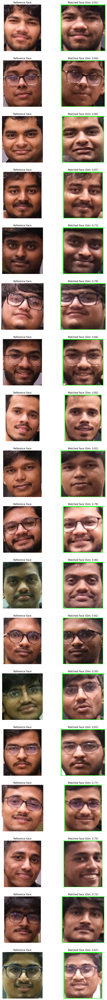

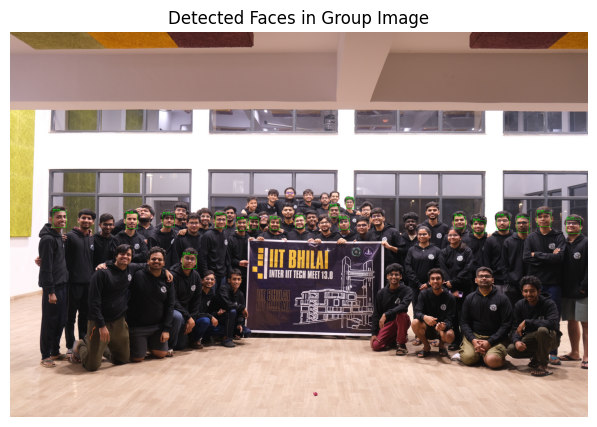

[(array([4999, 2038, 5128, 2172]), np.float32(0.81036264)),
 (array([1867, 2404, 2011, 2557]), np.float32(0.84028584)),
 (array([4797, 1989, 4915, 2119]), np.float32(0.80256593)),
 (array([2807, 2013, 2913, 2137]), np.float32(0.87110007)),
 (array([2586, 2016, 2685, 2129]), np.float32(0.7279695)),
 (array([6008, 2021, 6157, 2174]), np.float32(0.7917304)),
 (array([2450, 2020, 2557, 2142]), np.float32(0.84322894)),
 (array([1251, 1962, 1378, 2122]), np.float32(0.8457308)),
 (array([5691, 1946, 5840, 2101]), np.float32(0.8137381)),
 (array([3082, 1998, 3183, 2115]), np.float32(0.7930269)),
 (array([3453, 1882, 3554, 1999]), np.float32(0.8033598)),
 (array([5473, 2006, 5609, 2163]), np.float32(0.80738604)),
 (array([3555, 2014, 3665, 2136]), np.float32(0.5041157)),
 (array([5254, 1987, 5394, 2134]), np.float32(0.8308743)),
 (array([2220, 1971, 2337, 2116]), np.float32(0.7693167)),
 (array([ 464, 1934,  611, 2110]), np.float32(0.7524164)),
 (array([1649, 1967, 1775, 2105]), np.float32(0.71

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import cosine_similarity

# Function to get a list of image files from a folder
def get_image_files(folder_path):
    image_files = []
    for filename in os.listdir(folder_path):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            image_files.append(os.path.join(folder_path, filename))
    return image_files

# Define the folder containing the individual face images to match against
FOLDER_INPUT_IMAGES = "/content/faces"  # Change to your folder path

# Get the list of image files from the specified folder
files = get_image_files(FOLDER_INPUT_IMAGES)
print("Files in folder:", files)

group_img = "/content/DSCF3076.JPG"   # Change to your group image path

match_faces(group_img, files)